In [82]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import os

os.chdir('../')

from tgmm import GaussianMixture, GMMInitializer, dynamic_figsize, plot_gmm

device = 'cpu'
random_state = 0
np.random.seed(random_state)
torch.manual_seed(random_state)

if device == 'cuda':
    torch.cuda.manual_seed(random_state)
    print('CUDA version:', torch.version.cuda)
    print('Device:', torch.cuda.get_device_name(0))
else:
    print('Using CPU')

Using CPU



Fitting GMM with 1 component (single Gaussian)
Single Gaussian - KL Divergence: 13.3723


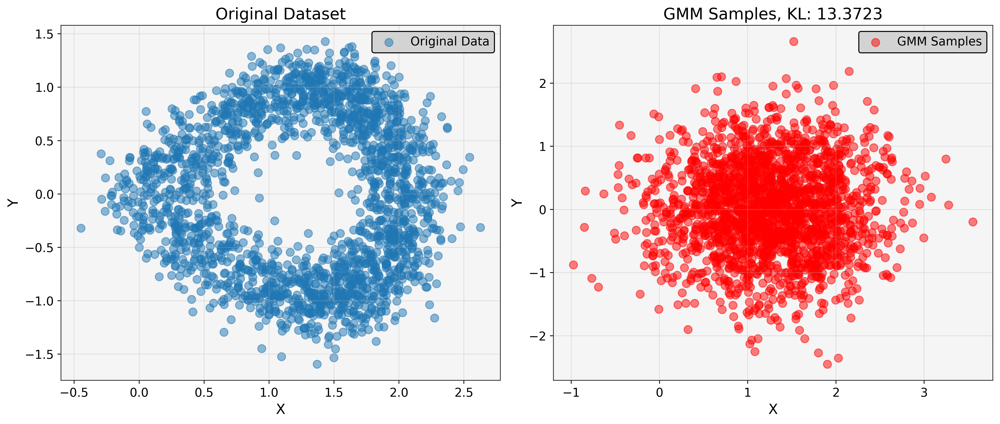

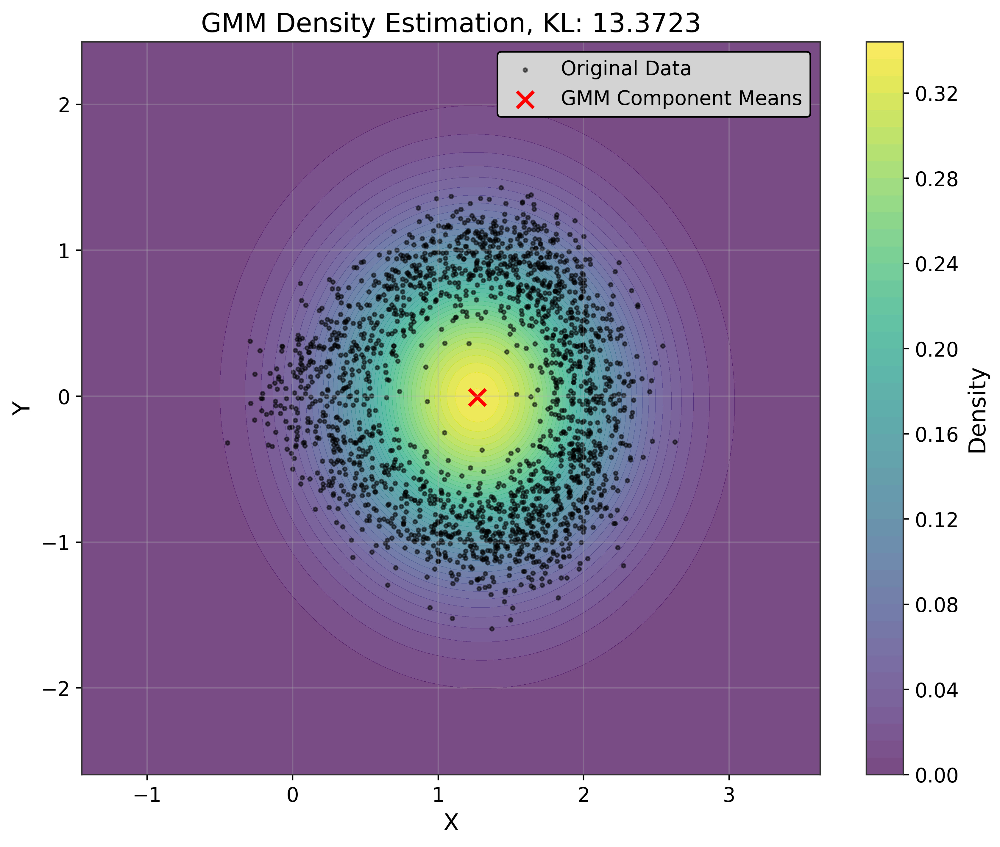


KL Divergence Results:
Single Gaussian: 13.3723


In [83]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats



# Create a banana-shaped dataset
def create_banana_dataset(n_samples=1000, noise=0.1):
    """Create a banana-shaped dataset in 2D."""
    t = np.linspace(0, np.pi, n_samples)
    x = 2 * np.sin(t) + np.random.normal(0, noise, n_samples)
    y = np.sin(2 * t) + np.random.normal(0, noise, n_samples)
    data = np.column_stack([x, y])
    return torch.tensor(data, dtype=torch.float32)

# Function to estimate KL divergence using k-nearest neighbor method
import torch
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
from scipy.spatial import cKDTree  # Add this import

# Function to estimate KL divergence using k-nearest neighbor method
def knn_kl_divergence(X, Y, k=5):
    """
    Estimate KL divergence using k-nearest neighbor method
    X, Y: datasets (torch tensors)
    k: number of nearest neighbors to consider
    """
    n, m = len(X), len(Y)
    
    # Move tensors to CPU before converting to NumPy
    X_cpu = X.cpu() if X.is_cuda else X
    Y_cpu = Y.cpu() if Y.is_cuda else Y
    
    X_np, Y_np = X_cpu.numpy(), Y_cpu.numpy()
    d = X.shape[1]  # dimension
    
    # Calculate k-nn distances for each point in X relative to X
    tree_X = cKDTree(X_np)  # Changed from stats.cKDTree to cKDTree
    dist_X, _ = tree_X.query(X_np, k=k+1)  # +1 because first neighbor is the point itself
    eps_X = dist_X[:, -1]  # distance to k-th neighbor
    
    # Count points from Y within eps_X for each point in X
    tree_Y = cKDTree(Y_np)  # Changed from stats.cKDTree to cKDTree
    count_Y = np.zeros(n)
    for i in range(n):
        count_Y[i] = len(tree_Y.query_ball_point(X_np[i], eps_X[i]))
    
    # Calculate KL divergence
    count_Y = np.maximum(count_Y, 1)  # avoid division by zero
    kl = d * np.mean(np.log(m / count_Y)) + np.log(n / (n-1))
    
    return kl

# Function to visualize GMM samples and density
def visualize_gmm(X, gmm, n_samples, title_prefix="GMM"):
    # Sample from the fitted GMM
    samples, _ = gmm.sample(n_samples=n_samples)
    
    # Calculate KL divergence
    kl_div = knn_kl_divergence(X, samples)
    print(f"{title_prefix} - KL Divergence: {kl_div:.4f}")
    
    # Create figure with 2 subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))
    
    # Plot original data vs samples
    ax1.scatter(X[:, 0].numpy(), X[:, 1].numpy(), alpha=0.5, label='Original Data')
    ax1.set_title('Original Dataset')
    ax1.set_xlabel('X')
    ax1.set_ylabel('Y')
    ax1.grid(True)
    ax1.legend()
    
    ax2.scatter(samples[:, 0].numpy(), samples[:, 1].numpy(), alpha=0.5, color='red', label='GMM Samples')
    ax2.set_title(f'GMM Samples, KL: {kl_div:.4f}')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    ax2.grid(True)
    ax2.legend()
    
    plt.tight_layout()
    plt.show()
    
    # Visualize the density
    x_min, x_max = X[:, 0].min().item() - 1, X[:, 0].max().item() + 1
    y_min, y_max = X[:, 1].min().item() - 1, X[:, 1].max().item() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
    X_grid = torch.tensor(np.c_[xx.ravel(), yy.ravel()], dtype=torch.float32)
    
    # Get log probabilities
    log_probs = gmm.score_samples(X_grid)
    Z = np.exp(log_probs.numpy())
    Z = Z.reshape(xx.shape)
    
    # Create the density plot
    plt.figure(figsize=(10, 8))
    plt.contourf(xx, yy, Z, levels=50, cmap='viridis', alpha=0.7)
    plt.colorbar(label='Density')
    plt.scatter(X[:, 0].numpy(), X[:, 1].numpy(), s=5, alpha=0.5, label='Original Data', color='black')
    
    # Plot the component means
    means = gmm.means_.detach().numpy()
    plt.scatter(means[:, 0], means[:, 1], c='red', s=100, marker='x', label='GMM Component Means')
    
    plt.title(f'GMM Density Estimation, KL: {kl_div:.4f}')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return kl_div

# Main experiment function
def run_gmm_experiment():
    # Create the banana-shaped dataset
    n_samples = 2000
    X = create_banana_dataset(n_samples, noise=0.2)
    
    # Test with 1 component (single Gaussian)
    print("\nFitting GMM with 1 component (single Gaussian)")
    gmm1 = GaussianMixture(
        n_components=1,
        n_features=2,
        covariance_type='full',
        init_params='kmeans',
        max_iter=100,
        random_state=random_state,
        device=device,
    )
    gmm1.fit(X)
    kl1 = visualize_gmm(X, gmm1, n_samples, "Single Gaussian")
    
    # Print final comparison
    print("\nKL Divergence Results:")
    print(f"Single Gaussian: {kl1:.4f}")
    

if __name__ == "__main__":
    run_gmm_experiment()

In [84]:
def get_component_covariance(gmm, idx):
    """
    Extract covariance matrix for a specific component based on covariance_type.
    
    Parameters:
    -----------
    gmm : GaussianMixture
        The Gaussian Mixture Model
    idx : int
        Component index
        
    Returns:
    --------
    cov : torch.Tensor
        Covariance matrix in full form (n_features, n_features)
    """
    if gmm.covariance_type == 'full':
        return gmm.covariances_[idx]
    
    elif gmm.covariance_type == 'diag':
        return torch.diag(gmm.covariances_[idx])
    
    elif gmm.covariance_type == 'spherical':
        n_features = gmm.means_.shape[1]
        return gmm.covariances_[idx] * torch.eye(n_features, device=gmm.means_.device)
    
    elif gmm.covariance_type == 'tied_full':
        return gmm.covariances_
    
    elif gmm.covariance_type == 'tied_diag':
        return torch.diag(gmm.covariances_)
    
    elif gmm.covariance_type == 'tied_spherical':
        n_features = gmm.means_.shape[1]
        return gmm.covariances_ * torch.eye(n_features, device=gmm.means_.device)
    
    else:
        raise ValueError(f"Unknown covariance type: {gmm.covariance_type}")

def gmm_kl_divergence_monte_carlo(gmm_p, gmm_q, n_samples=100000):
    # Draw samples from the first GMM
    X, _ = gmm_p.sample(n_samples=n_samples)
    
    # Evaluate log probabilities under both GMMs
    log_p = gmm_p.score_samples(X)
    log_q = gmm_q.score_samples(X)
    
    # Compute KL divergence
    kl_div = torch.mean(log_p - log_q)
    return kl_div.item()

def gaussian_kl_divergence(mean1, cov1, mean2, cov2):
    """KL divergence between two multivariate Gaussians (closed form)"""
    k = mean1.shape[0]  # Dimensionality
    
    # Calculate log|Σ2|/|Σ1|
    logdet1 = torch.logdet(cov1)
    logdet2 = torch.logdet(cov2)
    
    # Calculate tr(Σ2^-1 Σ1)
    cov2_inv = torch.inverse(cov2)
    trace_term = torch.trace(cov2_inv @ cov1)
    
    # Calculate (μ2-μ1)^T Σ2^-1 (μ2-μ1)
    mean_diff = mean2 - mean1
    mahalanobis = mean_diff @ cov2_inv @ mean_diff
    
    # Combine terms
    kl = 0.5 * (logdet2 - logdet1 + trace_term + mahalanobis - k)
    return kl

def gmm_component_kl(gmm_p, gmm_q):
    """Approximate KL(P||Q) by matching components and computing weighted KL"""
    n_components = gmm_p.n_components
    if gmm_q.n_components != n_components:
        raise ValueError("Both GMMs must have the same number of components")
    
    # Match components based on means (Hungarian algorithm would be better)
    # This is a simple greedy matching for illustration
    kl_sum = 0.0
    for i in range(n_components):
        mean_p = gmm_p.means_[i]
        cov_p = get_component_covariance(gmm_p, i)
        
        # Find closest component in Q
        min_dist = float('inf')
        best_j = 0
        for j in range(n_components):
            mean_q = gmm_q.means_[j]
            dist = torch.norm(mean_p - mean_q)
            if dist < min_dist:
                min_dist = dist
                best_j = j
        
        mean_q = gmm_q.means_[best_j]
        cov_q = get_component_covariance(gmm_q, best_j)
        
        # Compute KL and weight by component weight
        kl_sum += gmm_p.weights_[i] * gaussian_kl_divergence(mean_p, cov_p, mean_q, cov_q)
    
    return kl_sum


def gmm_variational_kl(gmm_p, gmm_q):
    """Variational approximation to KL(P||Q) for GMMs"""
    kl_sum = 0.0
    n_components_p = gmm_p.n_components
    n_components_q = gmm_q.n_components
    
    for i in range(n_components_p):
        min_kl = float('inf')
        best_j = 0
        
        for j in range(n_components_q):
            # Get means and covariances
            mean_p = gmm_p.means_[i]
            cov_p = get_component_covariance(gmm_p, i)
            
            mean_q = gmm_q.means_[j]
            cov_q = get_component_covariance(gmm_q, j)
            
            # Calculate KL between these components
            kl_ij = gaussian_kl_divergence(mean_p, cov_p, mean_q, cov_q)
            
            # Take minimum KL across Q components
            if kl_ij < min_kl:
                min_kl = kl_ij
                best_j = j
        
        # Add weighted KL to sum
        kl_sum += gmm_p.weights_[i] * (min_kl - torch.log(gmm_q.weights_[best_j]))
    
    return kl_sum

In [85]:
# Create the banana dataset
X = create_banana_dataset(n_samples=2000, noise=0.2)

# Fit GMM to the dataset
gmm = GaussianMixture(n_components=5, n_features=2, covariance_type='spherical')
gmm.fit(X)

# Create a different GMM to compare against
# This could be:
# 1. A GMM fitted to different data
# 2. A GMM with different parameters
# 3. A GMM fitted to samples from your first GMM
gmm2 = GaussianMixture(n_components=5, n_features=2, covariance_type='full')
gmm2.fit(X)

# Calculate KL divergence using Monte Carlo
kl_mc = gmm_kl_divergence_monte_carlo(gmm, gmm2)
print(f"KL divergence (Monte Carlo): {kl_mc:.4f}")

# Or using component-wise approximation
kl_comp = gmm_component_kl(gmm, gmm2)
print(f"KL divergence (Component-wise): {kl_comp:.4f}")

# Or using variational approximation
kl_var = gmm_variational_kl(gmm, gmm2)
print(f"KL divergence (Variational): {kl_var:.4f}")

KL divergence (Monte Carlo): 0.1872
KL divergence (Component-wise): 1.0423
KL divergence (Variational): 2.6481


Comparing distributions...
Number of samples in X: 2000
Number of samples in Y: 2000
Number of dimensions: 2
Metrics to compute: ['mmd', 'wasserstein', 'jensen_shannon', 'energy_distance']
Calculating metrics...
Calculating MMD...
Calculating Wasserstein distance...
Calculating Jensen-Shannon divergence...
Calculating Energy distance...

Distribution comparison metrics:
mmd: 0.046690
wasserstein: 0.297792
jensen_shannon: 0.043860
energy_distance: 0.139565


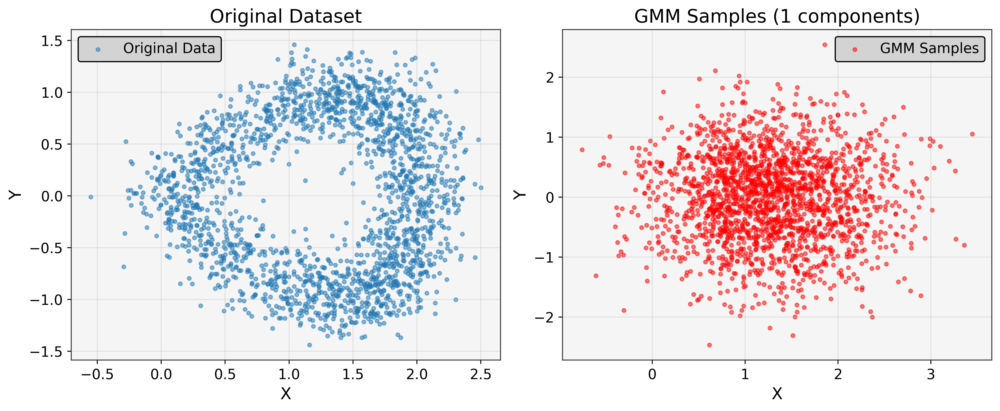

Comparing distributions...
Number of samples in X: 2000
Number of samples in Y: 2000
Number of dimensions: 2
Metrics to compute: ['mmd', 'wasserstein', 'jensen_shannon', 'energy_distance']
Calculating metrics...
Calculating MMD...
Calculating Wasserstein distance...
Calculating Jensen-Shannon divergence...
Calculating Energy distance...

Distribution comparison metrics:
mmd: 0.032363
wasserstein: 0.223581
jensen_shannon: 0.025145
energy_distance: 0.097903


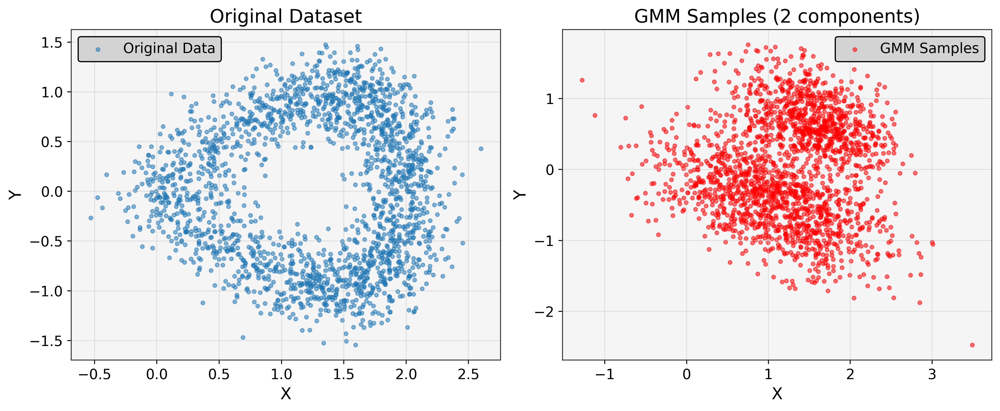

Comparing distributions...
Number of samples in X: 2000
Number of samples in Y: 2000
Number of dimensions: 2
Metrics to compute: ['mmd', 'wasserstein', 'jensen_shannon', 'energy_distance']
Calculating metrics...
Calculating MMD...
Calculating Wasserstein distance...
Calculating Jensen-Shannon divergence...
Calculating Energy distance...

Distribution comparison metrics:
mmd: 0.000000
wasserstein: 0.129728
jensen_shannon: 0.012098
energy_distance: 0.036910


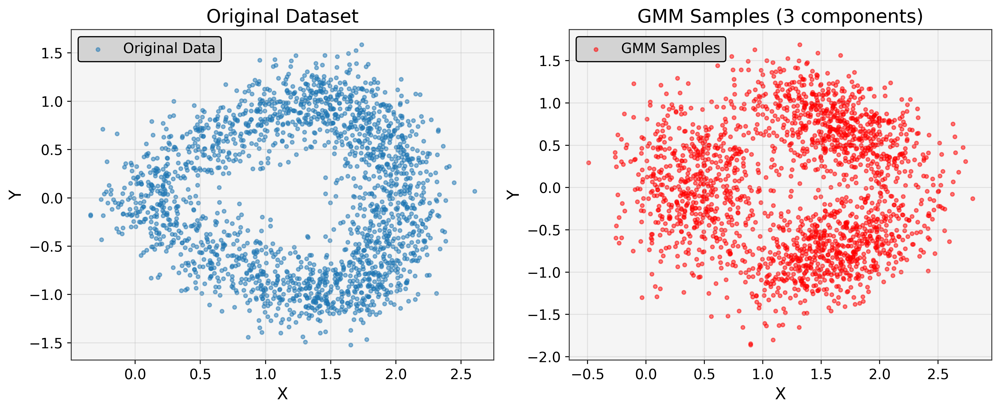

Comparing distributions...
Number of samples in X: 2000
Number of samples in Y: 2000
Number of dimensions: 2
Metrics to compute: ['mmd', 'wasserstein', 'jensen_shannon', 'energy_distance']
Calculating metrics...
Calculating MMD...
Calculating Wasserstein distance...
Calculating Jensen-Shannon divergence...
Calculating Energy distance...

Distribution comparison metrics:
mmd: 0.000000
wasserstein: 0.071624
jensen_shannon: 0.007886
energy_distance: 0.000000


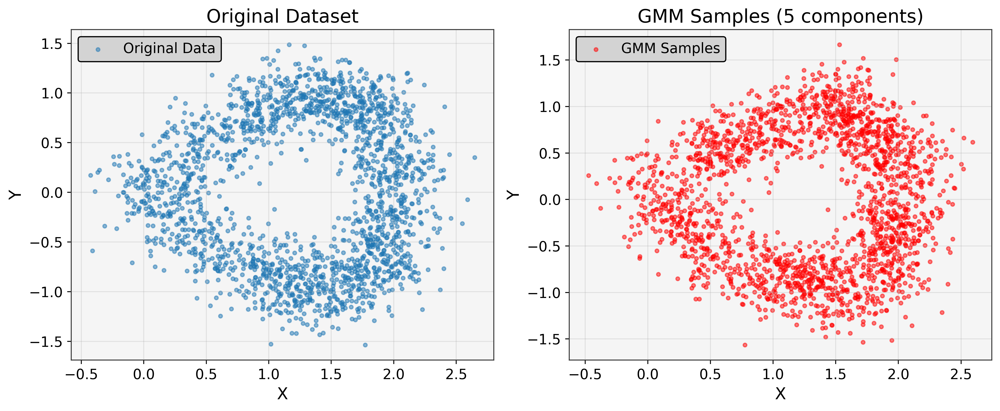

Comparing distributions...
Number of samples in X: 2000
Number of samples in Y: 2000
Number of dimensions: 2
Metrics to compute: ['mmd', 'wasserstein', 'jensen_shannon', 'energy_distance']
Calculating metrics...
Calculating MMD...
Calculating Wasserstein distance...
Calculating Jensen-Shannon divergence...
Calculating Energy distance...

Distribution comparison metrics:
mmd: 0.000000
wasserstein: 0.066156
jensen_shannon: 0.004292
energy_distance: 0.000000


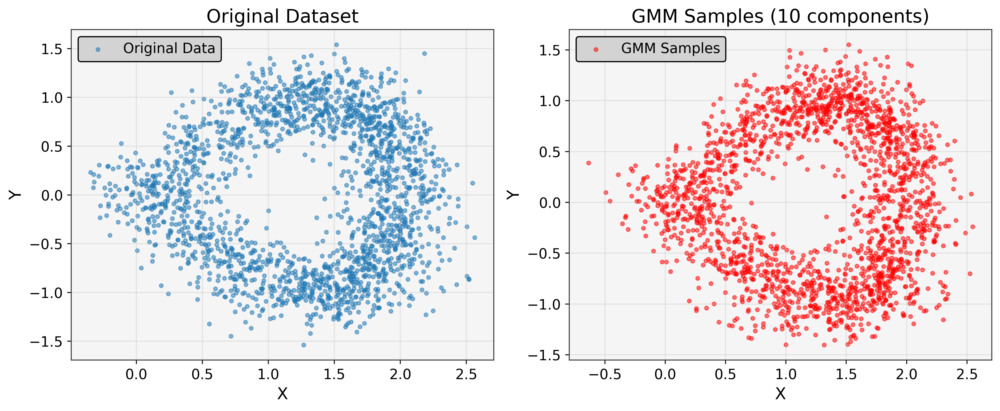

In [99]:
import torch
import numpy as np
from scipy import stats
from scipy.spatial import cKDTree

def maximum_mean_discrepancy(X, Y, kernel='gaussian', sigma=None):
    """
    Maximum Mean Discrepancy (MMD) measures distribution differences in a kernel space.
    
    Parameters:
    -----------
    X, Y : torch.Tensor
        Input data samples from two distributions
    kernel : str
        Kernel type ('gaussian' or 'linear')
    sigma : float or None
        Bandwidth parameter for Gaussian kernel (if None, uses median heuristic)
    
    Returns:
    --------
    float: MMD value (lower values indicate more similar distributions)
    """
    # Convert inputs to torch tensors if needed
    if not isinstance(X, torch.Tensor):
        X = torch.tensor(X, dtype=torch.float32)
    if not isinstance(Y, torch.Tensor):
        Y = torch.tensor(Y, dtype=torch.float32)
    
    # Move to CPU if on GPU
    X_cpu = X.cpu() if X.is_cuda else X
    Y_cpu = Y.cpu() if Y.is_cuda else Y
    
    nx, ny = X_cpu.shape[0], Y_cpu.shape[0]
    
    if kernel == 'gaussian':
        if sigma is None:
            # Median heuristic for sigma
            X_Y = torch.cat([X_cpu, Y_cpu], dim=0)
            pairwise_dists = torch.cdist(X_Y, X_Y, p=2) ** 2
            sigma = torch.sqrt(torch.median(pairwise_dists[pairwise_dists > 0]))
        
        # Compute kernel matrices
        def gaussian_kernel(x, y, sigma=sigma):
            return torch.exp(-torch.sum((x.unsqueeze(1) - y.unsqueeze(0)) ** 2, dim=2) / (2 * sigma ** 2))
        
        K_XX = gaussian_kernel(X_cpu, X_cpu)
        K_XY = gaussian_kernel(X_cpu, Y_cpu)
        K_YY = gaussian_kernel(Y_cpu, Y_cpu)
        
    elif kernel == 'linear':
        K_XX = X_cpu @ X_cpu.T
        K_XY = X_cpu @ Y_cpu.T
        K_YY = Y_cpu @ Y_cpu.T
    else:
        raise ValueError(f"Unsupported kernel type: {kernel}")
    
    # Calculate MMD^2 estimator
    mmd_squared = (torch.sum(K_XX) - torch.sum(torch.diag(K_XX))) / (nx * (nx - 1))
    mmd_squared += (torch.sum(K_YY) - torch.sum(torch.diag(K_YY))) / (ny * (ny - 1))
    mmd_squared -= 2 * torch.sum(K_XY) / (nx * ny)
    
    return torch.sqrt(torch.clamp(mmd_squared, min=0.0)).item()

def wasserstein_distance(X, Y):
    """
    Wasserstein Distance (Earth Mover's Distance) measures the minimum cost to 
    transform one distribution into another.
    
    Parameters:
    -----------
    X, Y : torch.Tensor
        Input data samples from two distributions
    
    Returns:
    --------
    float: Wasserstein distance (lower values indicate more similar distributions)
    """
    # Convert to numpy if tensors
    if isinstance(X, torch.Tensor):
        X = X.cpu().numpy() if X.is_cuda else X.numpy()
    if isinstance(Y, torch.Tensor):
        Y = Y.cpu().numpy() if Y.is_cuda else Y.numpy()
    
    # For 1D data, use scipy's efficient implementation
    if X.shape[1] == 1:
        return stats.wasserstein_distance(X.flatten(), Y.flatten())
    
    try:
        # Try to use POT library if available (best implementation)
        import ot
        
        n, m = len(X), len(Y)
        a, b = np.ones(n)/n, np.ones(m)/m  # Uniform distribution weights
        
        # Compute cost matrix - squared Euclidean distance
        M = ot.dist(X, Y, metric='sqeuclidean')
        
        # Compute Wasserstein distance (for Wasserstein-2, we use squared distances then sqrt result)
        w_dist = np.sqrt(ot.emd2(a, b, M))
        return w_dist
        
    except ImportError:
        # Fallback to a simpler implementation
        n, m = len(X), len(Y)
        all_dists = np.zeros((n, m))
        
        # Compute all pairwise distances
        for i in range(n):
            for j in range(m):
                all_dists[i, j] = np.sum((X[i] - Y[j])**2)
        
        # Greedy matching approximation
        total_cost = 0
        remaining_x = list(range(n))
        remaining_y = list(range(m))
        
        while remaining_x and remaining_y:
            # Find minimum distance pair
            min_val = float('inf')
            min_i, min_j = -1, -1
            
            for i_idx, i in enumerate(remaining_x):
                for j_idx, j in enumerate(remaining_y):
                    if all_dists[i, j] < min_val:
                        min_val = all_dists[i, j]
                        min_i, min_j = i_idx, j_idx
            
            # Add cost and remove matched points
            total_cost += np.sqrt(min_val)
            remaining_x.pop(min_i)
            remaining_y.pop(min_j)
        
        # Return average cost
        return total_cost / max(n, m)

def jensen_shannon_divergence(X, Y, n_bins=50):
    """
    Jensen-Shannon Divergence is a symmetric version of KL divergence.
    JS(P||Q) = 0.5*KL(P||M) + 0.5*KL(Q||M) where M = 0.5*(P+Q)
    
    Parameters:
    -----------
    X, Y : torch.Tensor
        Input data samples from two distributions
    n_bins : int
        Number of bins for histogram approximation
    
    Returns:
    --------
    float: JS divergence (lower values indicate more similar distributions)
    """
    # Convert to numpy if tensors
    if isinstance(X, torch.Tensor):
        X = X.cpu().numpy() if X.is_cuda else X.numpy()
    if isinstance(Y, torch.Tensor):
        Y = Y.cpu().numpy() if Y.is_cuda else Y.numpy()
    
    n_dims = X.shape[1]
    js_div = 0.0
    
    # Calculate JS for each dimension independently, then average
    for d in range(n_dims):
        # Get data for this dimension
        x_d = X[:, d]
        y_d = Y[:, d]
        
        # Define common bin edges
        min_val = min(x_d.min(), y_d.min())
        max_val = max(x_d.max(), y_d.max())
        bin_edges = np.linspace(min_val, max_val, n_bins+1)
        
        # Compute histograms
        p, _ = np.histogram(x_d, bins=bin_edges, density=True)
        q, _ = np.histogram(y_d, bins=bin_edges, density=True)
        
        # Add small epsilon to avoid log(0)
        epsilon = 1e-10
        p = p + epsilon
        q = q + epsilon
        
        # Normalize
        p = p / np.sum(p)
        q = q / np.sum(q)
        
        # Compute mixture distribution M = 0.5*(P+Q)
        m = 0.5 * (p + q)
        
        # Compute KL divergences
        kl_p_m = np.sum(p * np.log(p / m))
        kl_q_m = np.sum(q * np.log(q / m))
        
        # Compute JS divergence for this dimension
        js_d = 0.5 * kl_p_m + 0.5 * kl_q_m
        js_div += js_d
    
    # Return average JS across dimensions
    return js_div / n_dims

def energy_distance(X, Y):
    """
    Energy Distance is a statistical distance between distributions based on
    the expected distance between random vectors.
    
    E(P,Q) = 2*E[||X-Y||] - E[||X-X'||] - E[||Y-Y'||]
    
    Parameters:
    -----------
    X, Y : torch.Tensor
        Input data samples from two distributions
    
    Returns:
    --------
    float: Energy distance (lower values indicate more similar distributions)
    """
    # Convert to torch tensors if needed
    if not isinstance(X, torch.Tensor):
        X = torch.tensor(X, dtype=torch.float32)
    if not isinstance(Y, torch.Tensor):
        Y = torch.tensor(Y, dtype=torch.float32)
    
    # Move to CPU if on GPU
    X_cpu = X.cpu() if X.is_cuda else X
    Y_cpu = Y.cpu() if Y.is_cuda else Y
    
    nx, ny = X_cpu.shape[0], Y_cpu.shape[0]
    
    # Compute pairwise Euclidean distances
    XX_dist = torch.cdist(X_cpu, X_cpu, p=2)
    XY_dist = torch.cdist(X_cpu, Y_cpu, p=2)
    YY_dist = torch.cdist(Y_cpu, Y_cpu, p=2)
    
    # Calculate mean distances (excluding self-distances for XX and YY)
    XX_mean = (torch.sum(XX_dist) - torch.sum(torch.diag(XX_dist))) / (nx * (nx - 1))
    YY_mean = (torch.sum(YY_dist) - torch.sum(torch.diag(YY_dist))) / (ny * (ny - 1))
    XY_mean = torch.sum(XY_dist) / (nx * ny)
    
    # Calculate Energy Distance: 2*E[||X-Y||] - E[||X-X'||] - E[||Y-Y'||]
    energy_dist = 2 * XY_mean - XX_mean - YY_mean
    
    # Ensure non-negative result (theoretical value should be non-negative)
    return torch.sqrt(torch.clamp(energy_dist, min=0.0)).item()

def compare_distributions(X, Y, metrics=None):
    """
    Compare two datasets using multiple distribution metrics.
    
    Parameters:
    -----------
    X, Y : torch.Tensor
        Input data samples from two distributions
    metrics : list
        List of metrics to compute (default: all metrics)
    
    Returns:
    --------
    dict: Dictionary with computed metrics
    """
    if metrics is None:
        metrics = ['mmd', 'wasserstein', 'jensen_shannon', 'energy_distance']
    
    results = {}
    
    print("Comparing distributions...")
    print(f"Number of samples in X: {X.shape[0]}")
    print(f"Number of samples in Y: {Y.shape[0]}")
    print(f"Number of dimensions: {X.shape[1]}")
    print(f"Metrics to compute: {metrics}")
    print("Calculating metrics...")
    if 'mmd' in metrics:
        print("Calculating MMD...")
        results['mmd'] = maximum_mean_discrepancy(X, Y)
    
    if 'wasserstein' in metrics:
        print("Calculating Wasserstein distance...")
        results['wasserstein'] = wasserstein_distance(X, Y)
    
    if 'jensen_shannon' in metrics:
        print("Calculating Jensen-Shannon divergence...")
        results['jensen_shannon'] = jensen_shannon_divergence(X, Y)
    
    if 'energy_distance' in metrics:
        print("Calculating Energy distance...")
        results['energy_distance'] = energy_distance(X, Y)
    
    return results

# Example usage with GMM
def example_with_gmm(n_samples=2000, n_components=1):
    """
    Example showing how to use distribution metrics with GMM.
    
    Parameters:
    -----------
    n_samples : int
        Number of samples to generate
    n_components : int
        Number of GMM components
    
    Returns:
    --------
    dict: Results of distribution comparison
    """
    
    # Create a banana-shaped dataset
    def create_banana_dataset(n_samples=1000, noise=0.1):
        t = np.linspace(0, np.pi, n_samples)
        x = 2 * np.sin(t) + np.random.normal(0, noise, n_samples)
        y = np.sin(2 * t) + np.random.normal(0, noise, n_samples)
        data = np.column_stack([x, y])
        return torch.tensor(data, dtype=torch.float32)
    
    # Create the dataset
    X = create_banana_dataset(n_samples, noise=0.2)
    
    # Fit GMM to the dataset
    gmm = GaussianMixture(
        n_components=n_components,
        n_features=2,
        covariance_type='full',
        init_params='kmeans',
        max_iter=100,
        random_state=42,
        device=device,
    )
    gmm.fit(X)
    
    # Sample from the fitted GMM
    Y, _ = gmm.sample(n_samples=n_samples)
    
    # Compare distributions
    results = compare_distributions(X, Y)
    
    # Print results
    print("\nDistribution comparison metrics:")
    for name, value in results.items():
        print(f"{name}: {value:.6f}")
    
    import matplotlib.pyplot as plt
    
    # Visualize
    plt.figure(figsize=(12, 5))
    
    plt.subplot(1, 2, 1)
    plt.scatter(X[:, 0].numpy(), X[:, 1].numpy(), alpha=0.5, s=10, label='Original Data')
    plt.title('Original Dataset')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.scatter(Y[:, 0].numpy(), Y[:, 1].numpy(), alpha=0.5, s=10, color='red', label='GMM Samples')
    plt.title(f'GMM Samples ({n_components} components)')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    return results

if __name__ == "__main__":
    example_with_gmm(n_components=1)
    example_with_gmm(n_components=2)
    example_with_gmm(n_components=3)
    example_with_gmm(n_components=5)
    example_with_gmm(n_components=10)